In [1]:
import os # menejo de datos en win
import cv2 # tratamiento de imagenes
import numpy as np # estraer i guardar matriz de pixeles
import pickle # guardar dataset
import matplotlib.pyplot as plt # graficar imagenes
import shutil # operar archivos de alto nivel 

In [2]:
ruta_carpeta_train = './MY_data/train'  # Usa la ruta de tu carpeta de entramiento 
ruta_carpeta_test = 'MY_data/test' # usa la ruita de tu carpeta de datos de testeo

In [5]:
# Función para cargar y etiquetar imágenes ajustar tamaño de pixeles
def load_and_label_data(folder, output_folder):
    images = []
    labels = []
    for label, class_folder in enumerate(os.listdir(folder)):
        class_path = os.path.join(folder, class_folder)
        output_class_path = os.path.join(output_folder, class_folder)
        if not os.path.exists(output_class_path):
            os.makedirs(output_class_path)
        print(f"Cargando imágenes de la clase '{class_folder}'...")
        for i, filename in enumerate(os.listdir(class_path)):
            img = cv2.imread(os.path.join(class_path, filename))
            if img is not None:  # Verificar si la imagen se ha cargado correctamente
                if i < 3:
                    # Mostrar imágenes originales y redimensionadas
                    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                    axes[0].set_title('Imagen original')

                img_resized = cv2.resize(img, (100, 100))  # Redimensionar según sea necesario

                if i < 3:
                    # Mostrar imágenes redimensionadas
                    axes[1].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
                    axes[1].set_title('Imagen redimensionada')
                    plt.show()

                images.append(img_resized)
                labels.append(label)  # Usar el índice de la clase como etiqueta

                # Guardar imágenes redimensionadas en la nueva carpeta
                output_filename = os.path.join(output_class_path, filename)
                cv2.imwrite(output_filename, img_resized)
            else:
                print(f"Error al cargar la imagen: {os.path.join(class_path, filename)}")

    print("Carga y etiquetado completados.")
    return np.array(images), np.array(labels)

Cargando imágenes de la clase 'apple'...


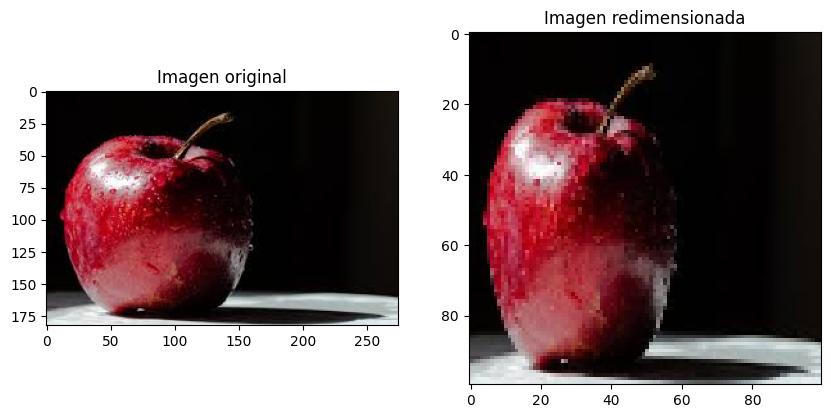

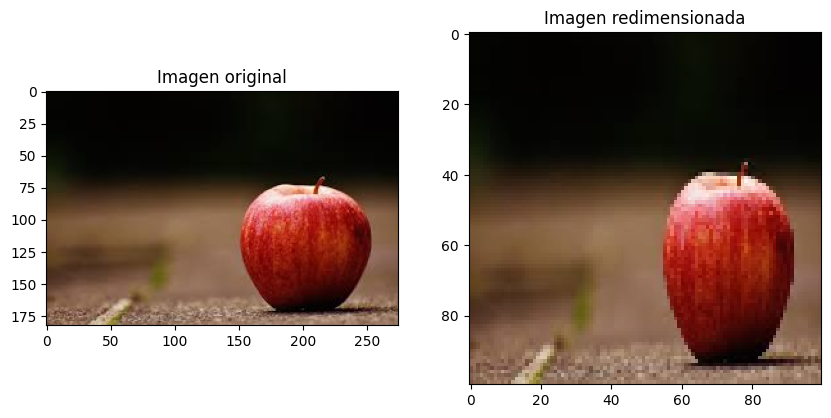

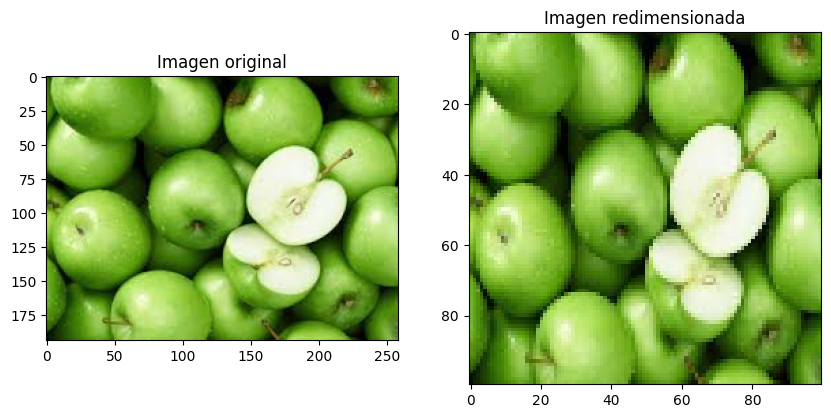

Cargando imágenes de la clase 'avocado'...


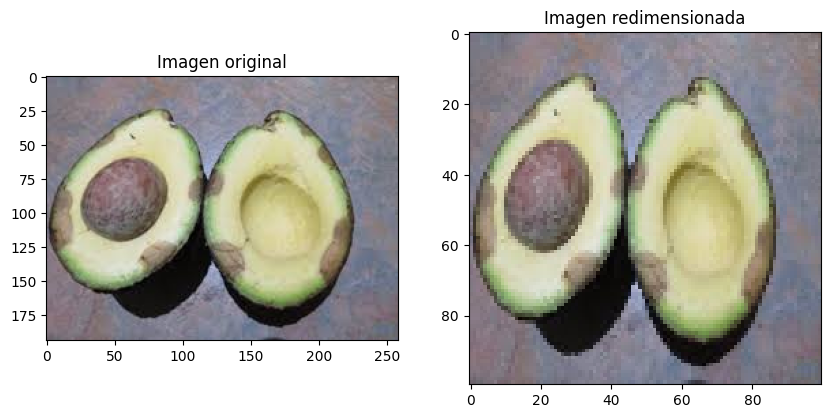

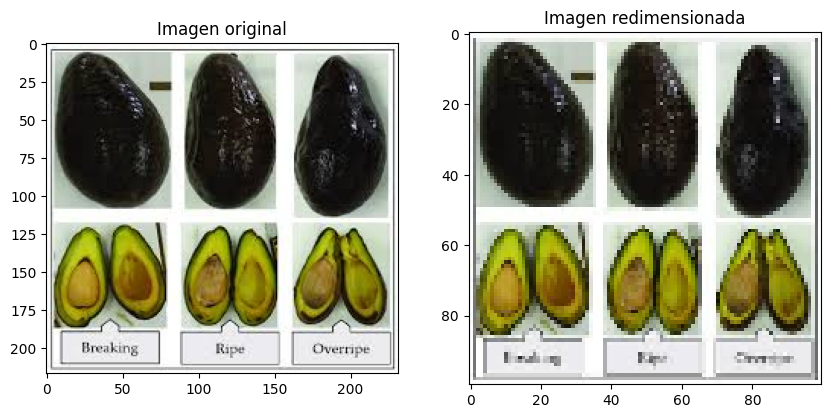

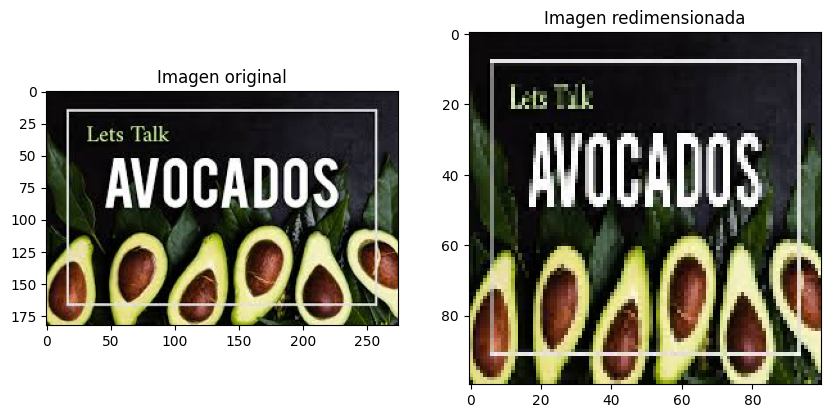

Cargando imágenes de la clase 'banana'...


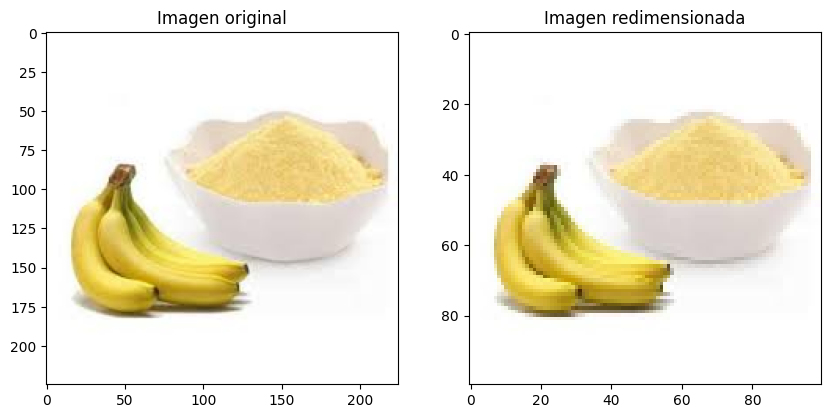

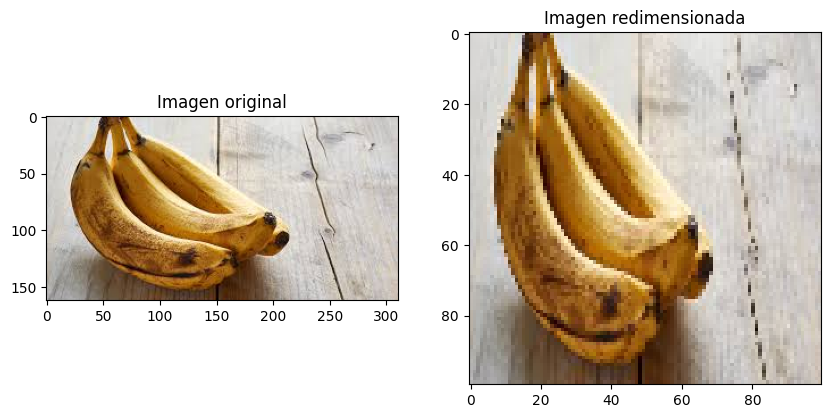

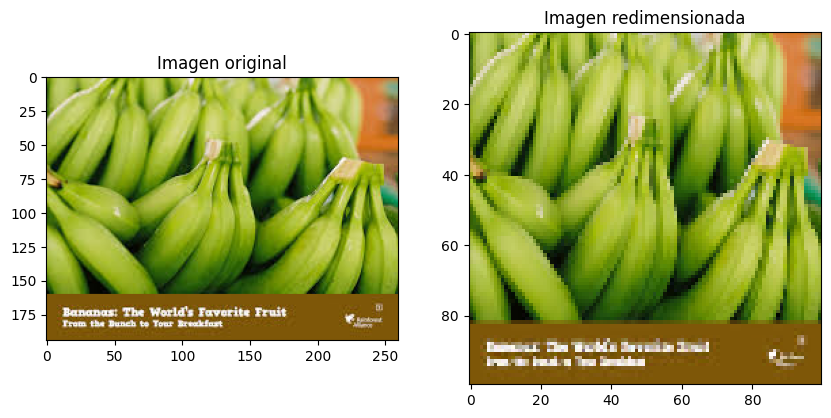

Cargando imágenes de la clase 'cherry'...


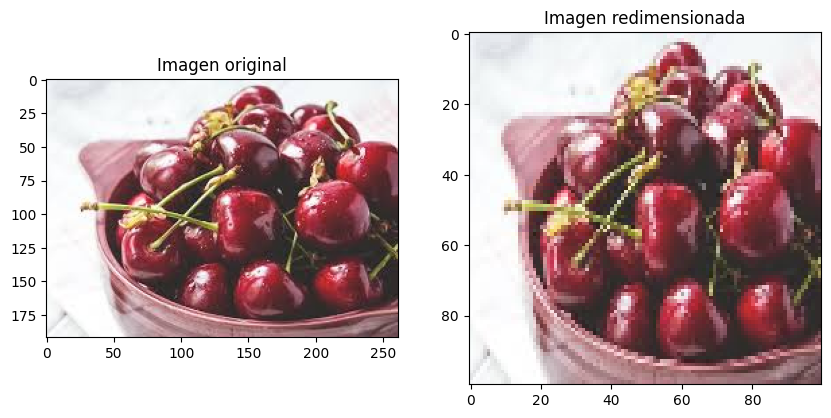

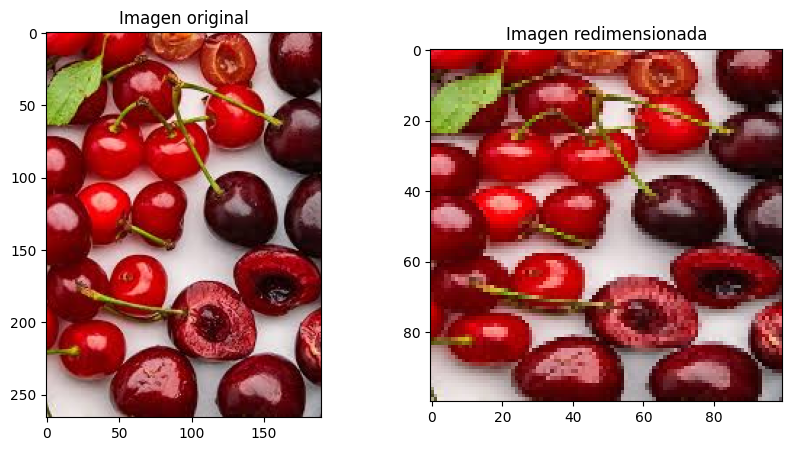

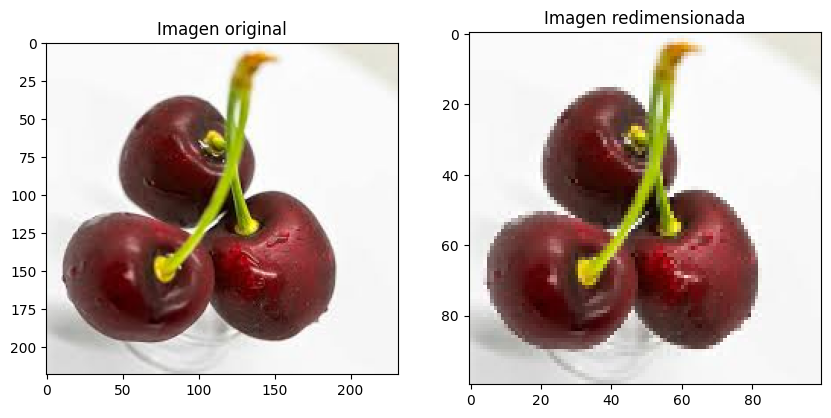

Cargando imágenes de la clase 'kiwi'...


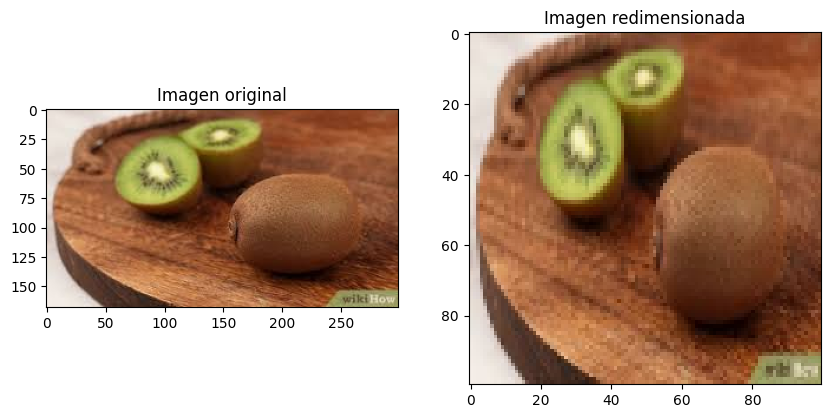

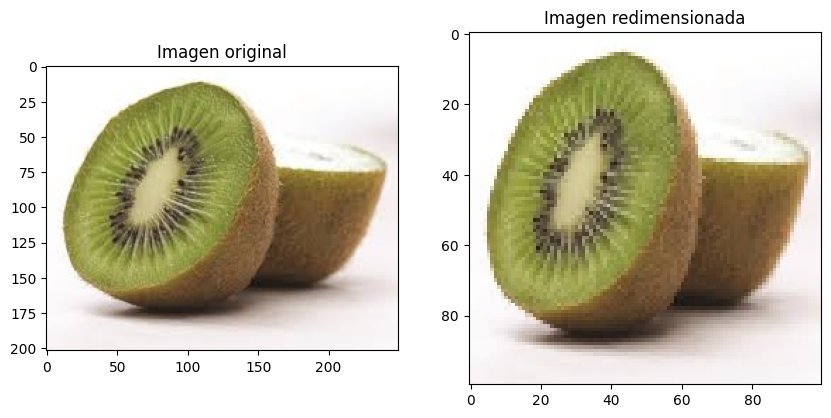

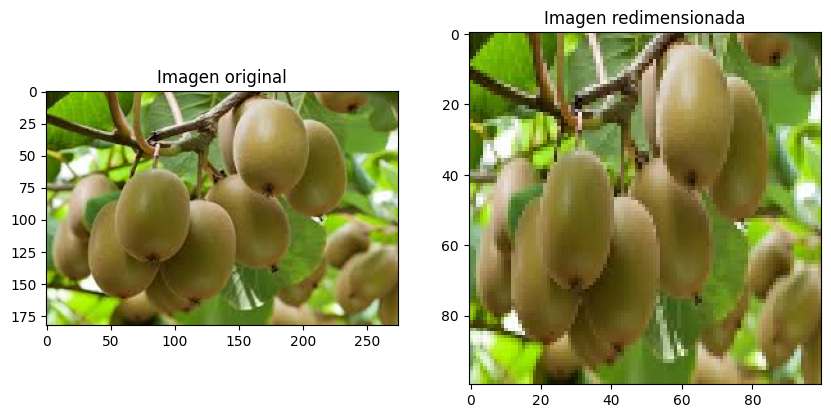

Cargando imágenes de la clase 'mango'...


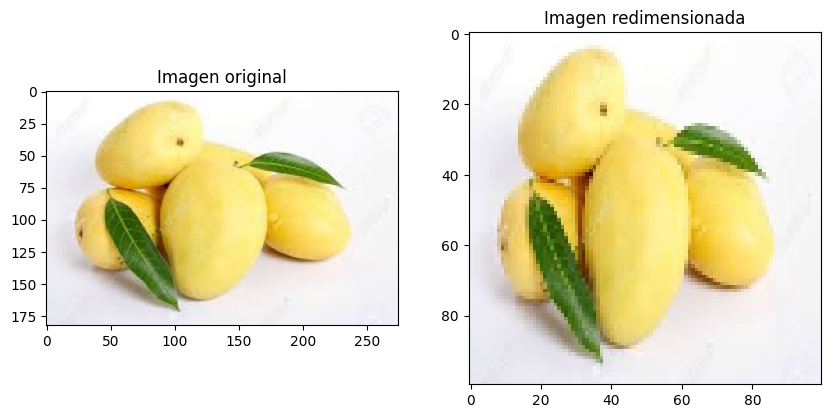

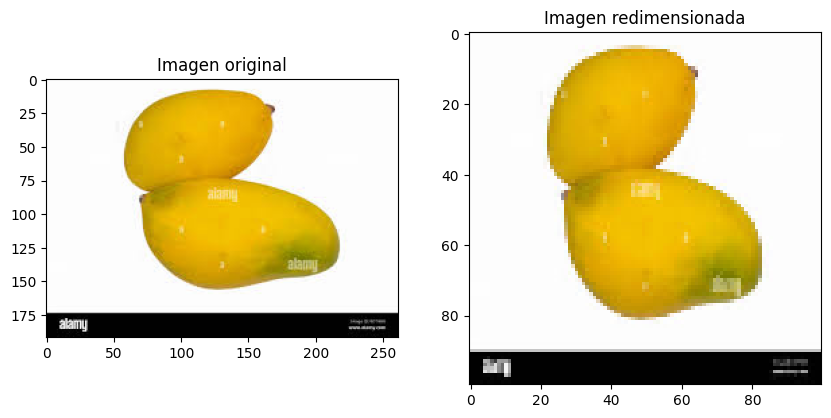

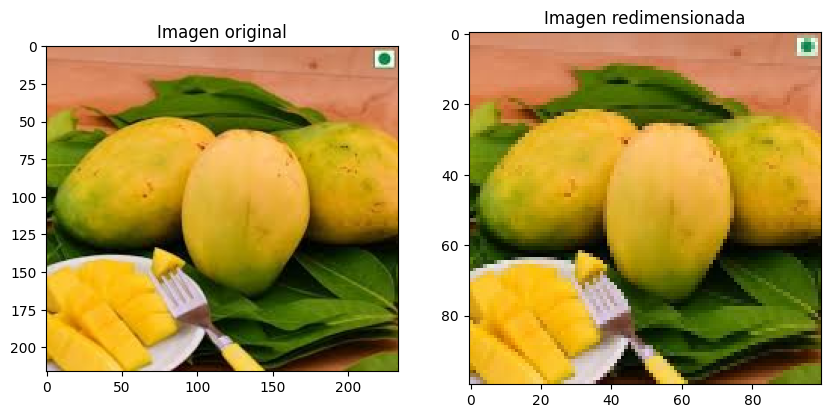

Cargando imágenes de la clase 'orange'...


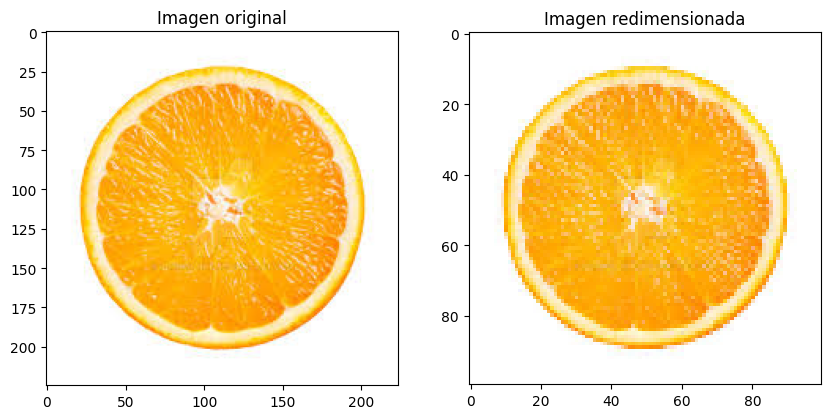

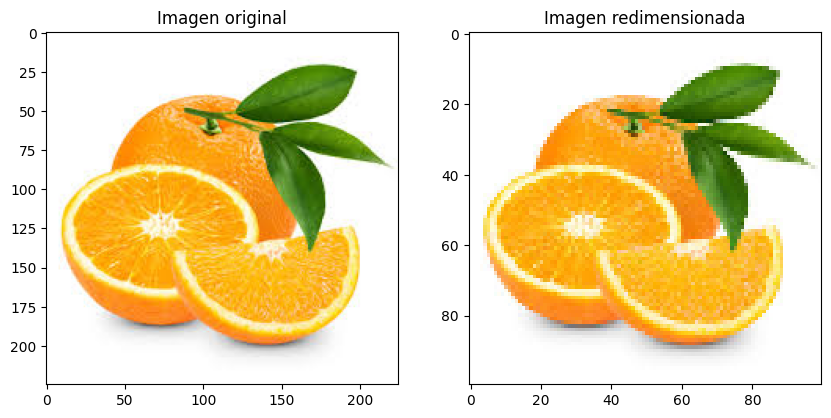

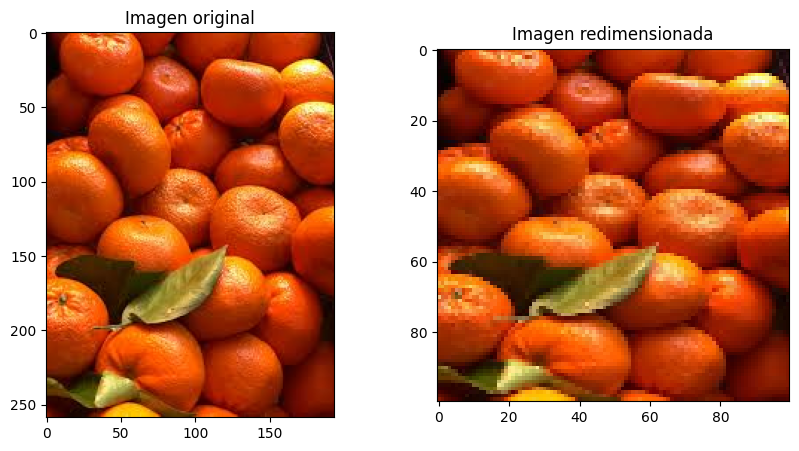

Error al cargar la imagen: ./MY_data/train\orange\img_2731.jpeg
Cargando imágenes de la clase 'pinenapple'...


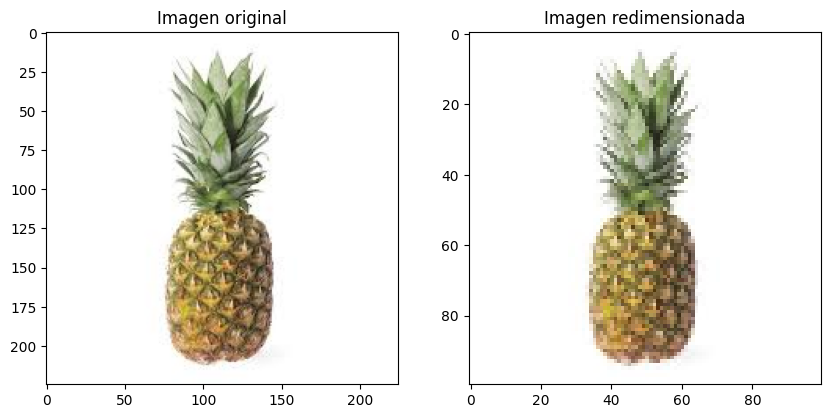

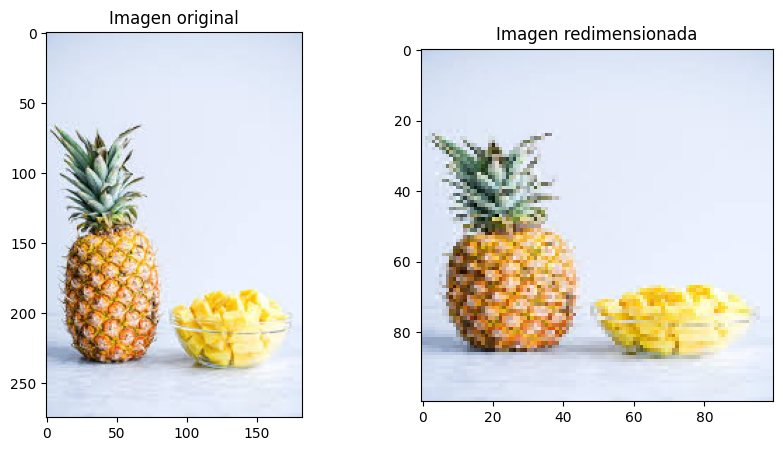

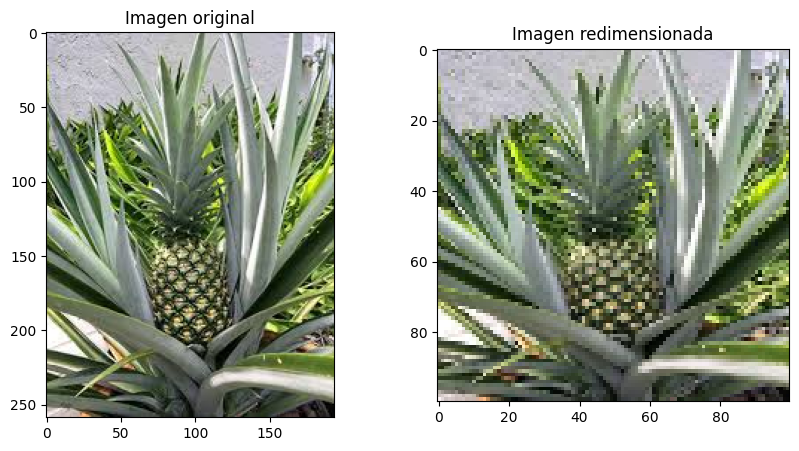

Cargando imágenes de la clase 'strawberries'...


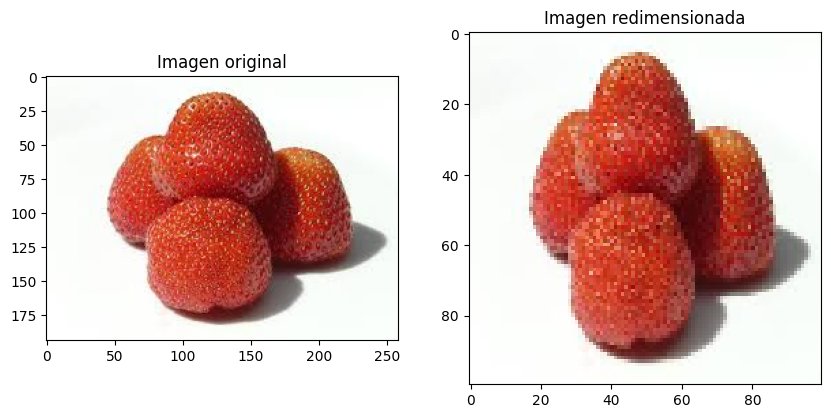

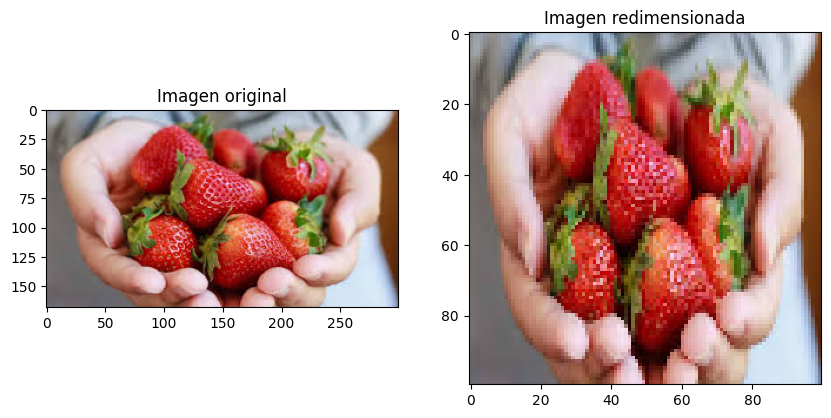

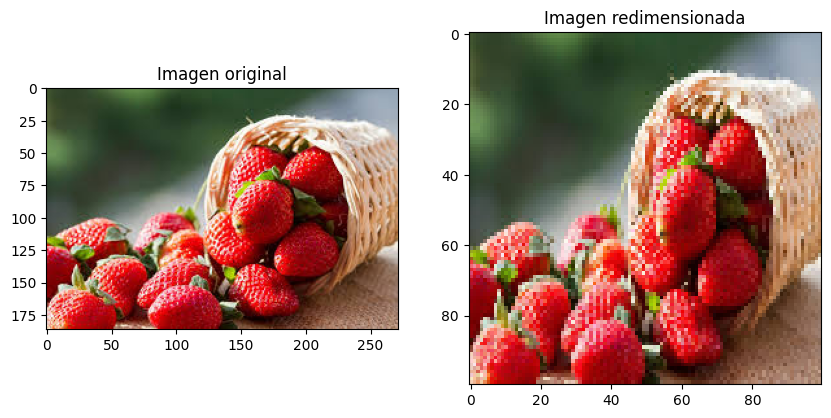

Cargando imágenes de la clase 'watermelon'...


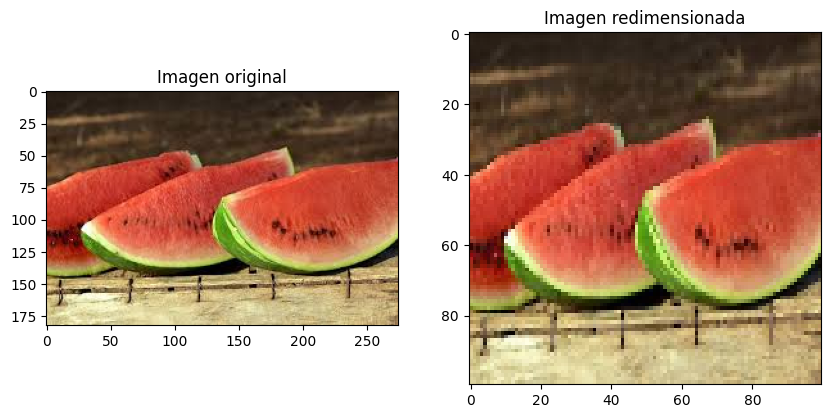

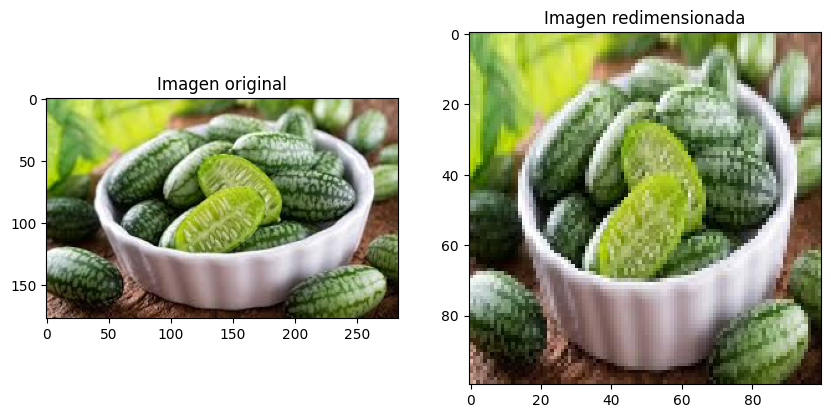

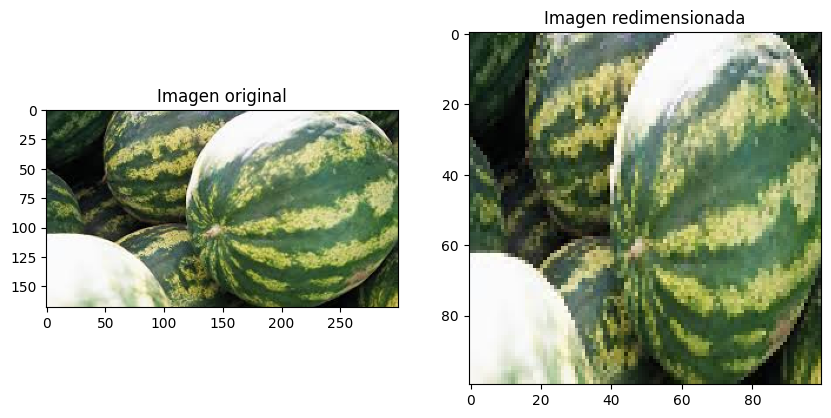

Carga y etiquetado completados.


In [8]:
output_folder = './Img_redimen' # definir la ruta en donde quiers guardar tus imagenes
# Cargar y etiquetar las imágenes y guardar las imágenes redimensionadas
X, y = load_and_label_data(ruta_carpeta_train, output_folder)


In [9]:
ruta_save_dataset= './dataset_frutas_train.pickle' # ruta donde se guardara tu dataset recuerda la extencion .pickle es por defecto eto permite guardar dataset 

with open(ruta_save_dataset, 'wb') as handle:
    pickle.dump((X, y), handle, protocol=pickle.HIGHEST_PROTOCOL)
print("Datos etiquetados guardados correctamente.")

Datos etiquetados guardados correctamente.


In [10]:
# Función para cargar y etiquetar imágenes en escala de grises se usa las imagenes de la carpeta Img_redimen
def load_and_label_data_grayscale(folder, output_folder):
    images = []
    labels = []
    for label, class_folder in enumerate(os.listdir(folder)):
        class_path = os.path.join(folder, class_folder)
        output_class_path = os.path.join(output_folder, class_folder)
        if not os.path.exists(output_class_path):
            os.makedirs(output_class_path)
        print(f"Cargando imágenes de la clase '{class_folder}'...")
        for filename in os.listdir(class_path):
            img = cv2.imread(os.path.join(class_path, filename), cv2.IMREAD_GRAYSCALE)
            if img is not None:  # Verificar si la imagen se ha cargado correctamente
                images.append(img)
                labels.append(label)  # Usar el índice de la clase como etiqueta

                # Guardar imágenes en escala de grises en la nueva carpeta
                output_filename = os.path.join(output_class_path, filename)
                cv2.imwrite(output_filename, img)
            else:
                print(f"Error al cargar la imagen: {os.path.join(class_path, filename)}")

    print("Carga y etiquetado completados.")
    return np.array(images), np.array(labels)

output_folder = './Img_grayscale'
ruta_carpeta_train_ID = './Img_redimen'

X, y = load_and_label_data_grayscale(ruta_carpeta_train_ID, output_folder)

Cargando imágenes de la clase 'apple'...
Cargando imágenes de la clase 'avocado'...
Cargando imágenes de la clase 'banana'...
Cargando imágenes de la clase 'cherry'...
Cargando imágenes de la clase 'kiwi'...
Cargando imágenes de la clase 'mango'...
Cargando imágenes de la clase 'orange'...
Cargando imágenes de la clase 'pinenapple'...
Cargando imágenes de la clase 'strawberries'...
Cargando imágenes de la clase 'watermelon'...
Carga y etiquetado completados.


In [11]:
ruta_save_dataset= './dataset_frutas_train_eg1.pickle'

with open(ruta_save_dataset, 'wb') as handle:
    pickle.dump((X, y), handle, protocol=pickle.HIGHEST_PROTOCOL)
print("Datos etiquetados guardados correctamente.")

Datos etiquetados guardados correctamente.


Cargando imágenes de la clase 'apple'...


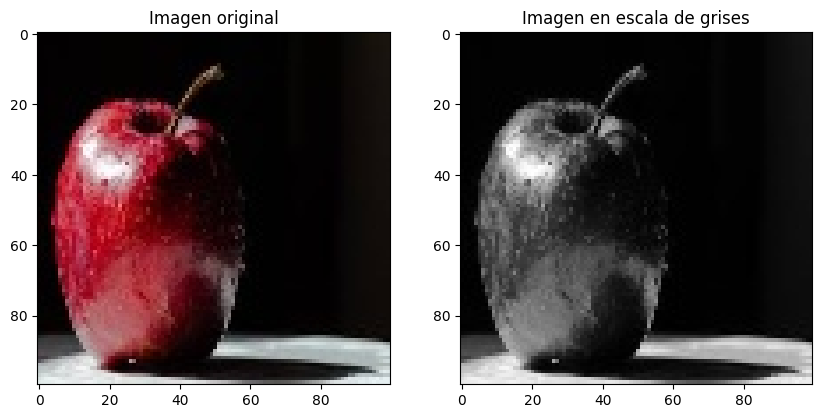

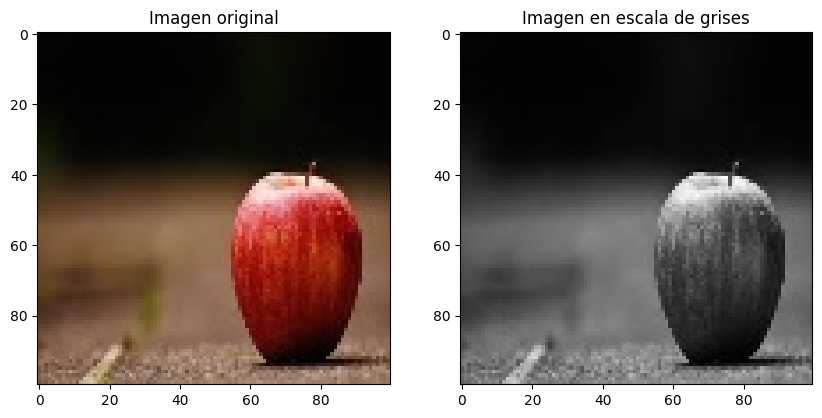

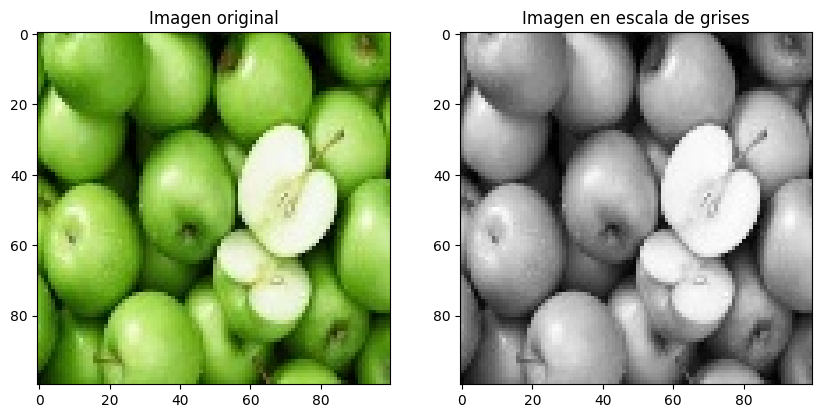

Cargando imágenes de la clase 'avocado'...


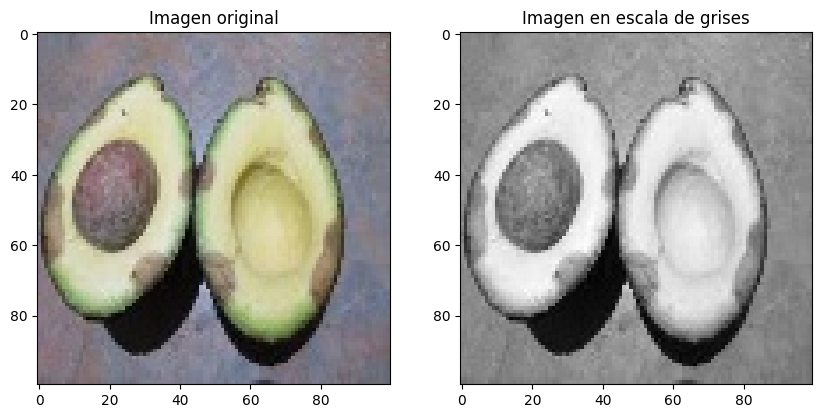

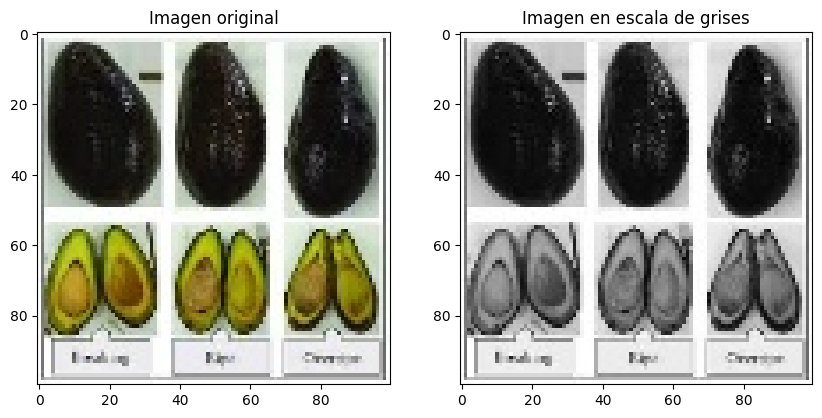

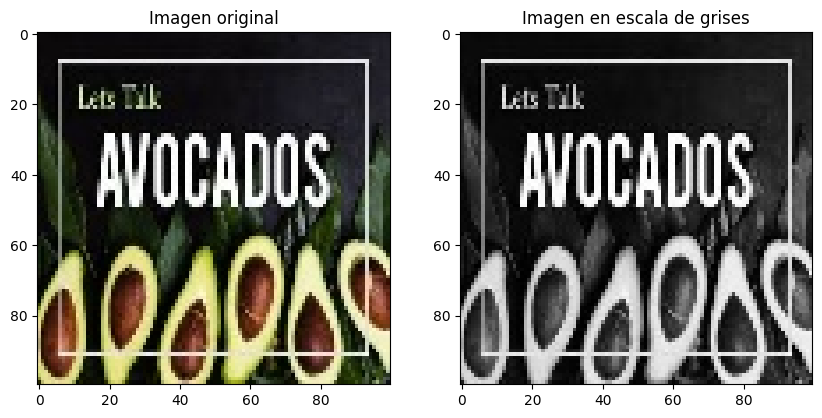

Cargando imágenes de la clase 'banana'...


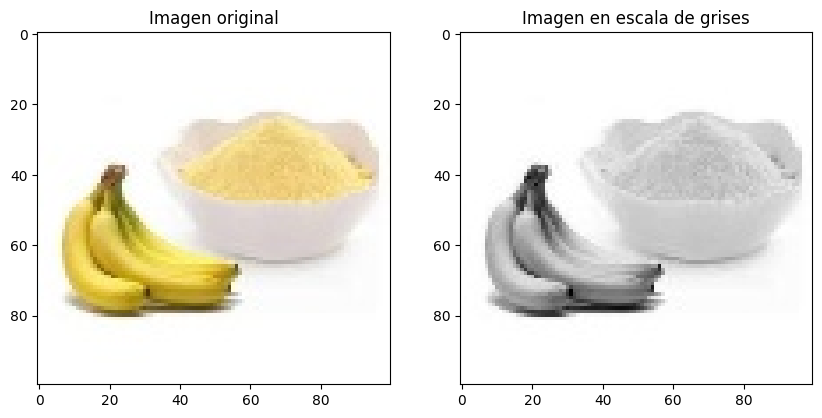

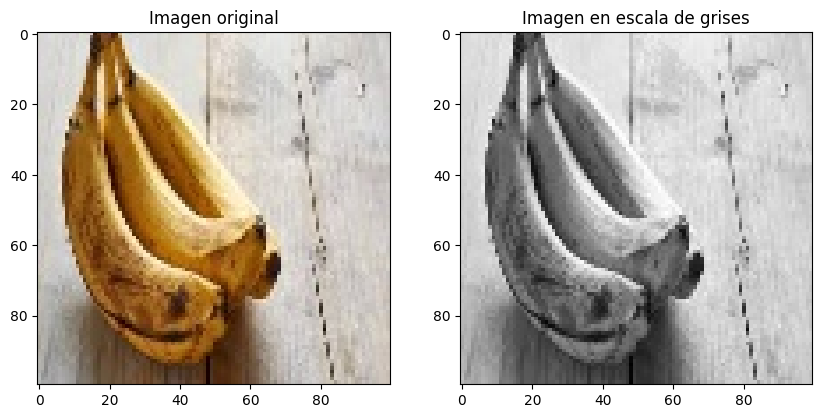

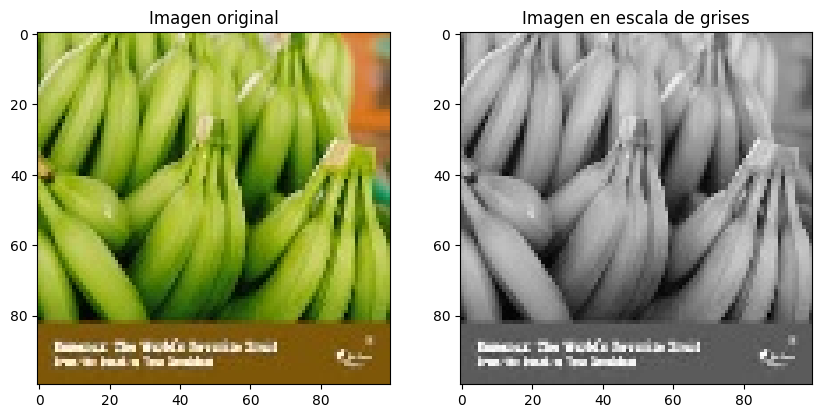

Cargando imágenes de la clase 'cherry'...


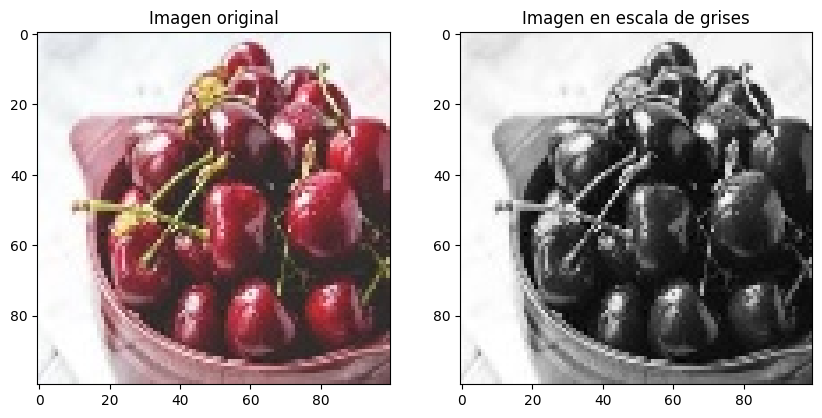

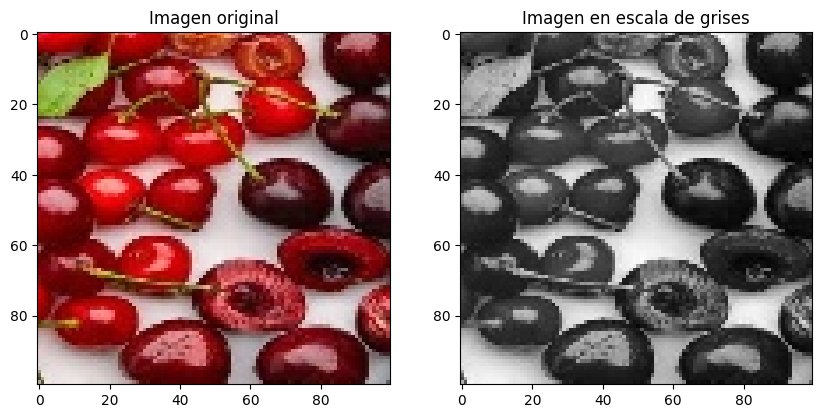

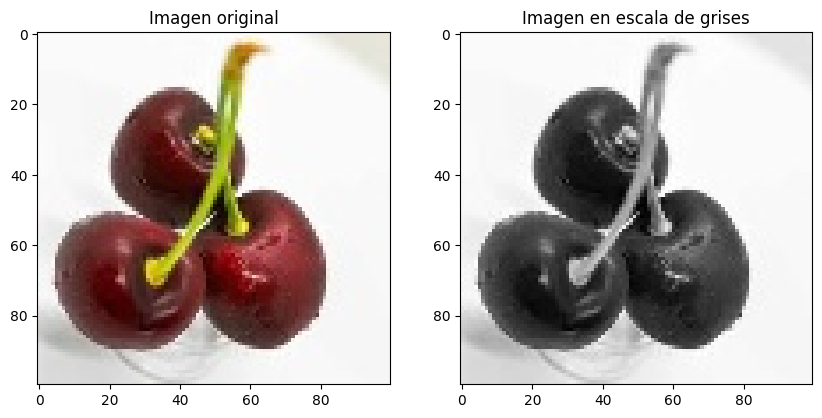

Cargando imágenes de la clase 'kiwi'...


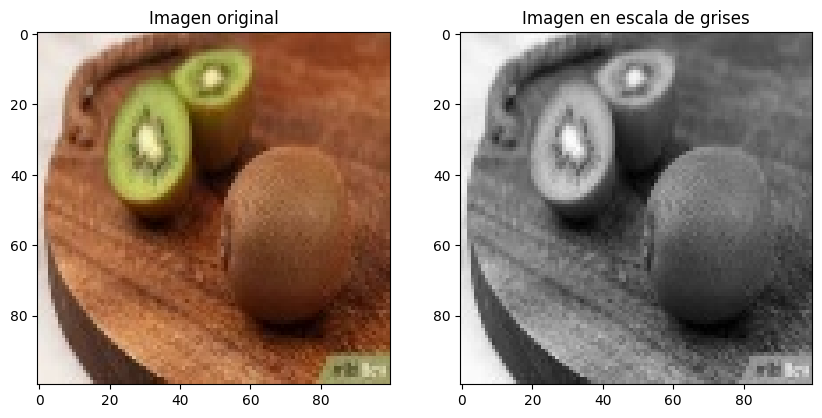

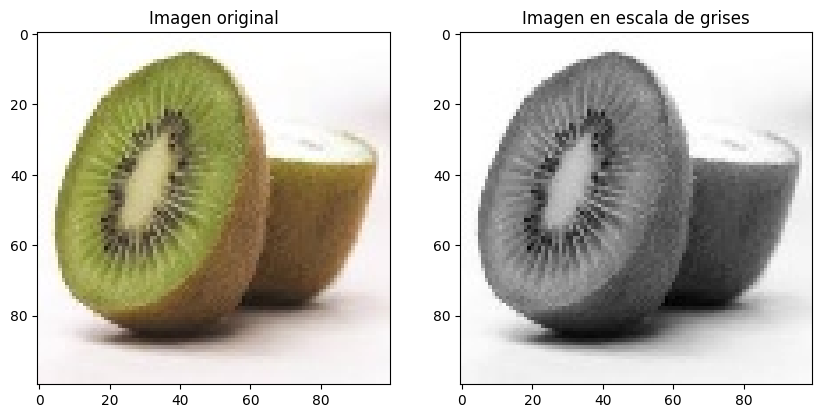

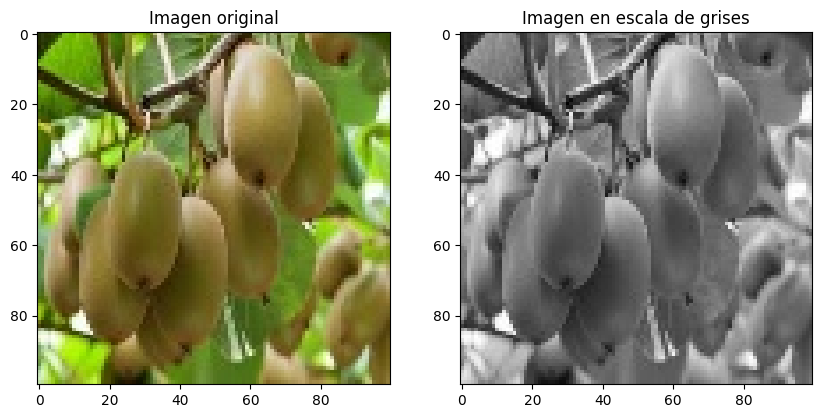

Cargando imágenes de la clase 'mango'...


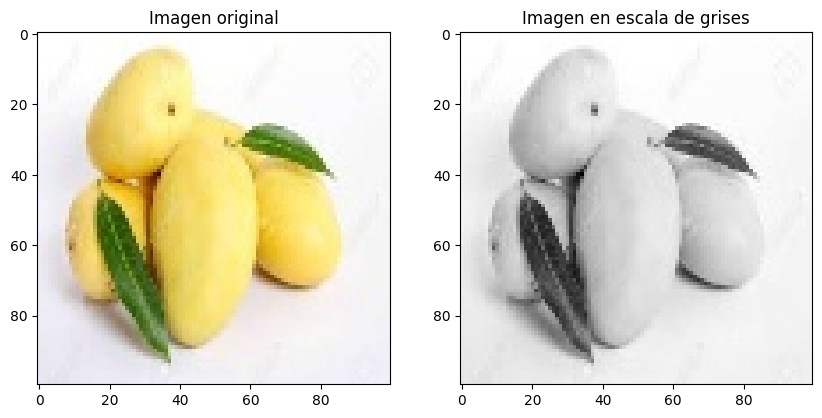

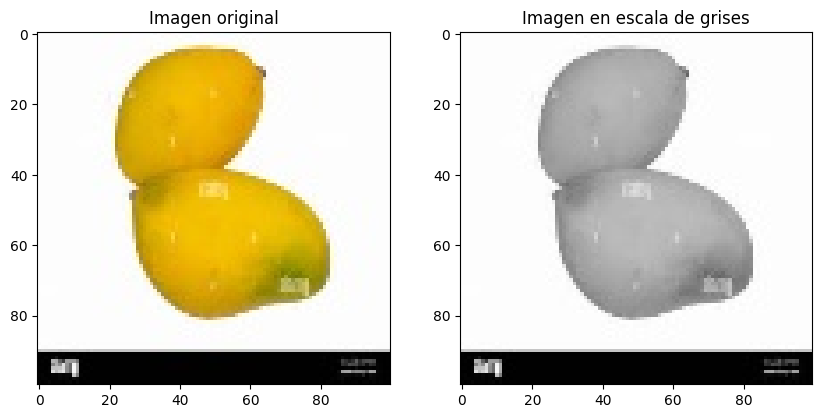

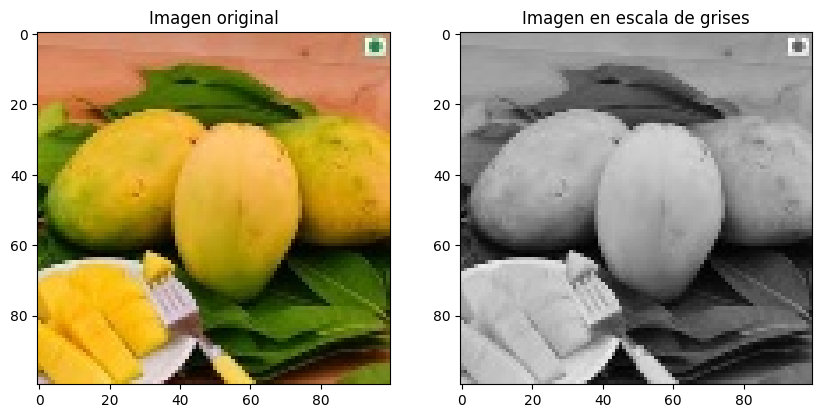

Cargando imágenes de la clase 'orange'...


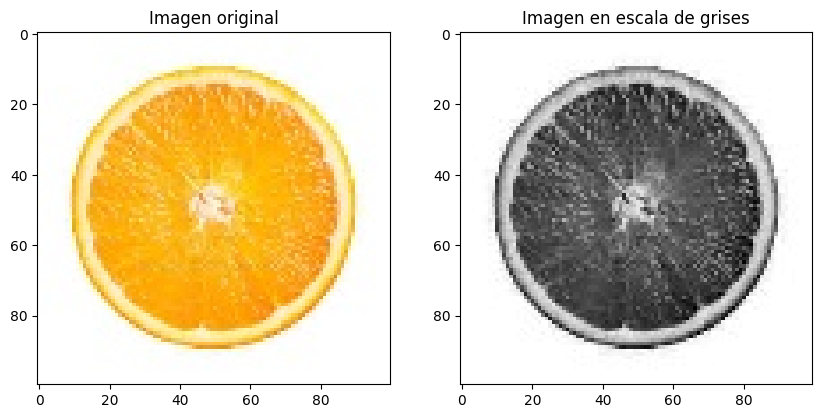

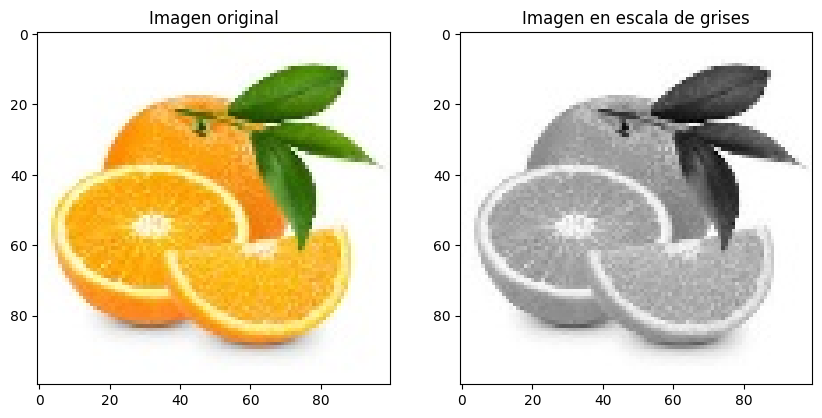

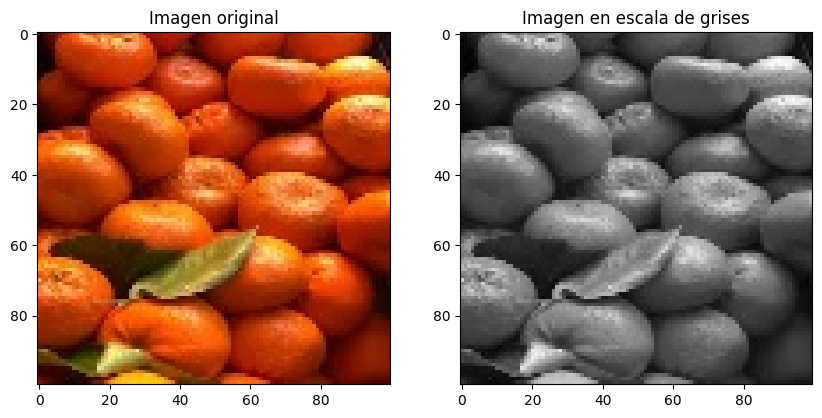

Cargando imágenes de la clase 'pinenapple'...


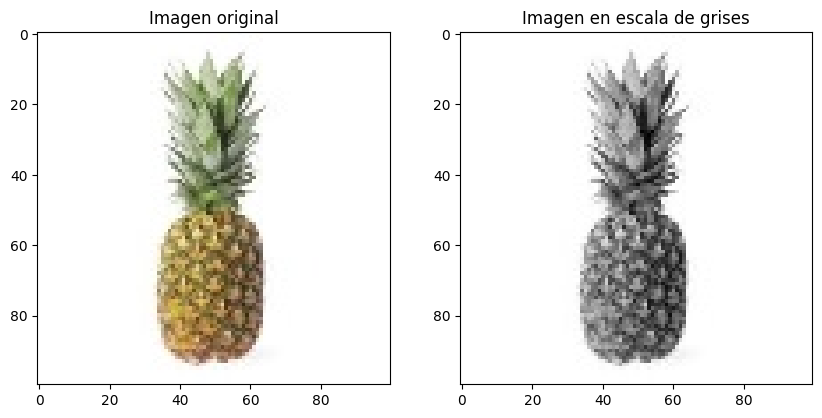

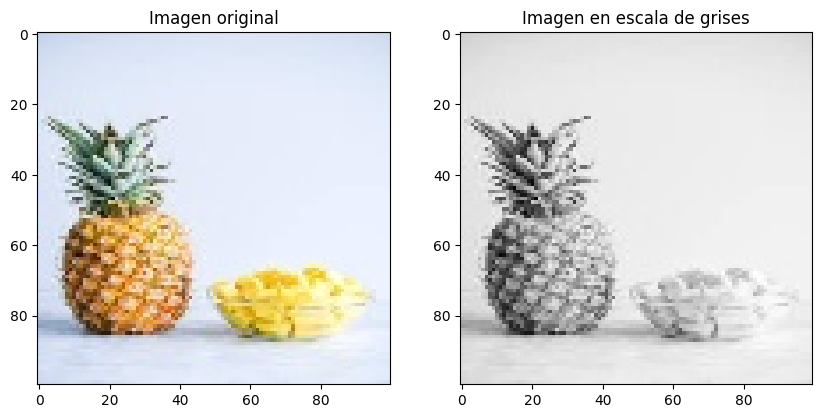

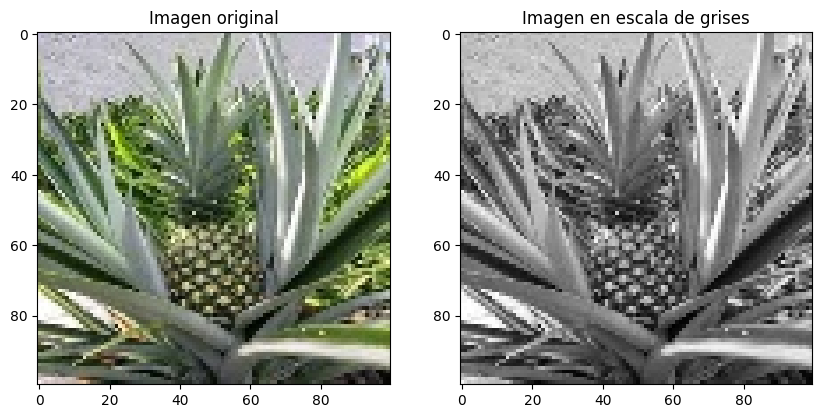

Cargando imágenes de la clase 'strawberries'...


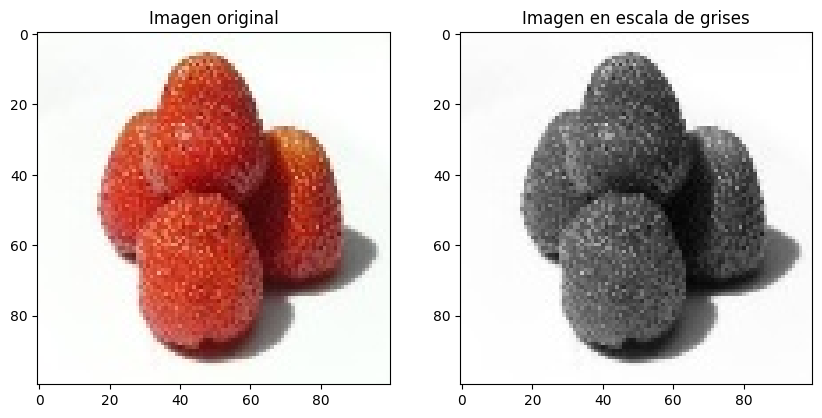

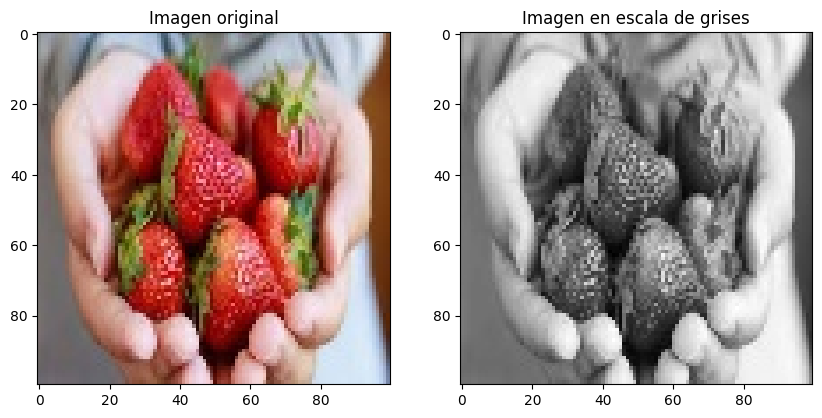

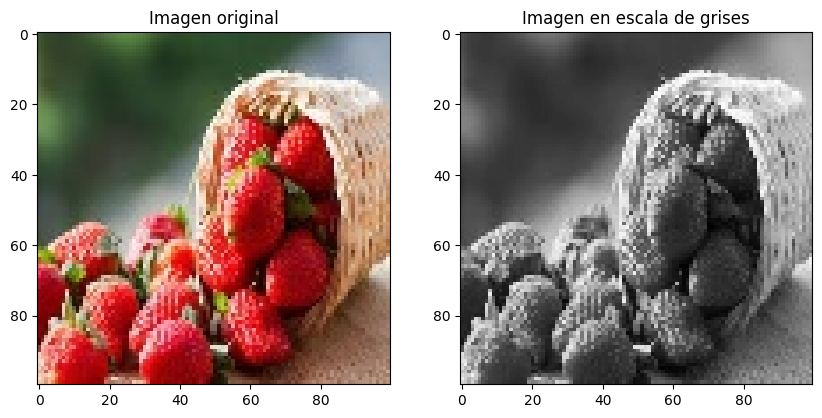

Cargando imágenes de la clase 'watermelon'...


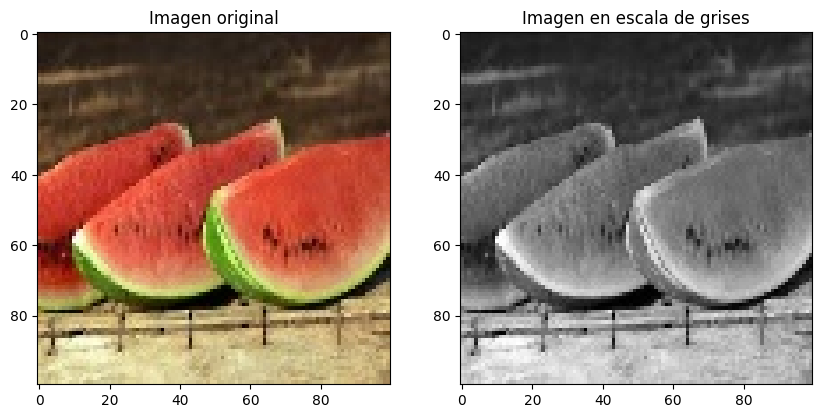

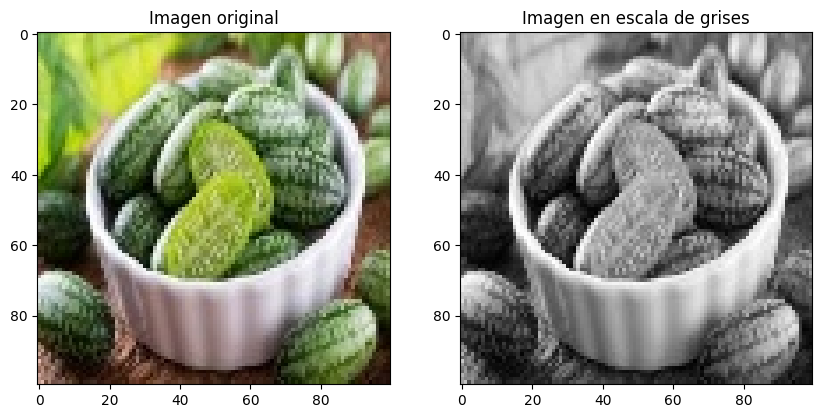

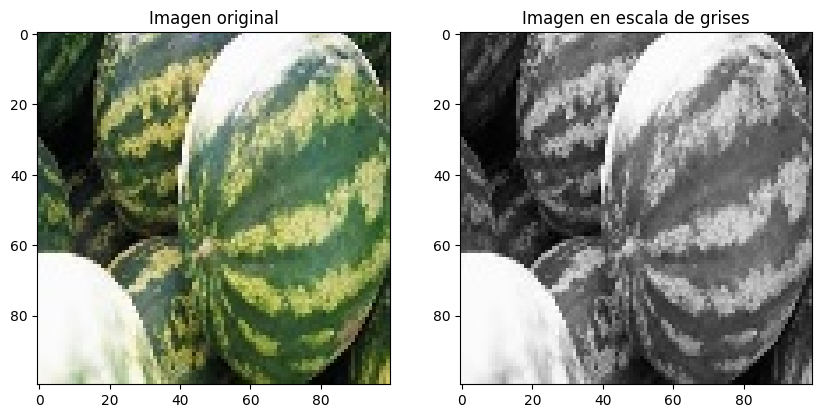

Carga y etiquetado completados.


In [12]:
# Función para cargar y etiquetar imágenes en escala de grises
def load_and_label_data_grayscale(folder, output_folder):
    images = []
    labels = []
    for label, class_folder in enumerate(os.listdir(folder)):
        class_path = os.path.join(folder, class_folder)
        output_class_path = os.path.join(output_folder, class_folder)
        if not os.path.exists(output_class_path):
            os.makedirs(output_class_path)
        print(f"Cargando imágenes de la clase '{class_folder}'...")
        for i, filename in enumerate(os.listdir(class_path)):
            img = cv2.imread(os.path.join(class_path, filename), cv2.IMREAD_GRAYSCALE)
            if img is not None:  # Verificar si la imagen se ha cargado correctamente
                images.append(img)
                labels.append(label)  # Usar el índice de la clase como etiqueta

                # Guardar imágenes en escala de grises en la nueva carpeta
                output_filename = os.path.join(output_class_path, filename)
                cv2.imwrite(output_filename, img)

                if i < 3:
                    # Mostrar imágenes originales y en escala de grises
                    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                    axes[0].imshow(cv2.cvtColor(cv2.imread(os.path.join(class_path, filename)), cv2.COLOR_BGR2RGB))
                    axes[0].set_title('Imagen original')

                    axes[1].imshow(img, cmap='gray')
                    axes[1].set_title('Imagen en escala de grises')
                    plt.show()

            else:
                print(f"Error al cargar la imagen: {os.path.join(class_path, filename)}")

    print("Carga y etiquetado completados.")
    return np.array(images), np.array(labels)


output_folder = './Img_grayscale_train'
ruta_carpeta_train_ID = './Img_redimen'

X, y = load_and_label_data_grayscale(ruta_carpeta_train_ID, output_folder)

In [13]:
ruta_dataset = 'dataset_frutas_train.pickle'
with open(ruta_dataset, 'rb') as handle:
    X_ft, y_ft = pickle.load(handle)

In [14]:
# Asegúrate de que X y y están cargados correctamente
print(f"X shape: {np.array(X_ft).shape}") # Debe mostrar algo como (n, 500, 500, 3) si son imágenes a color
print(f"y shape: {np.array(y_ft).shape}")

X shape: (2300, 100, 100, 3)
y shape: (2300,)


Primeras 3 imágenes de la clase 0:


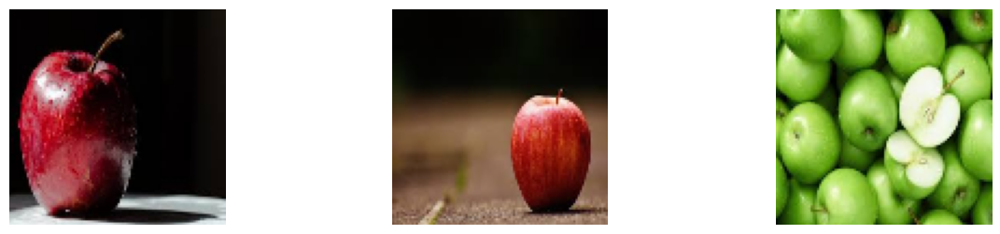

Primeras 3 imágenes de la clase 1:


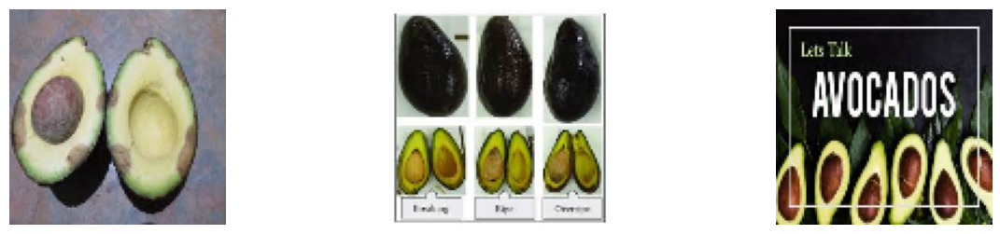

Primeras 3 imágenes de la clase 2:


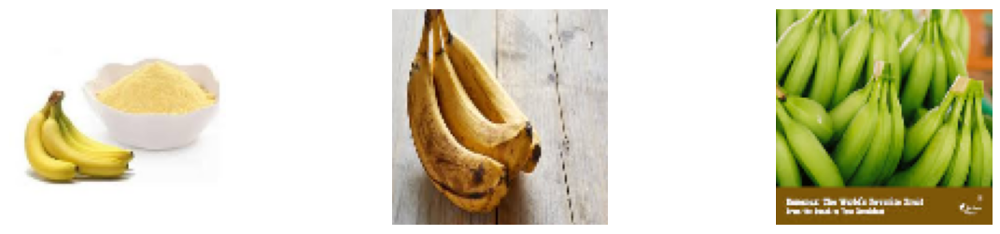

In [16]:
# Convertir de BGR a RGB para la visualización
X_rgb = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in X_ft]

def visualizar_primeras_imagenes_por_etiqueta(X, y, etiqueta, n=3):
    indices = np.where(y == etiqueta)[0][:n]
    fig, axs = plt.subplots(1, n, figsize=(15, 3))
    for i, idx in enumerate(indices):
        axs[i].imshow(X[idx], cmap='gray')
        axs[i].axis('off')
    plt.show()

# Visualiza las primeras 5 imágenes de cada etiqueta
# Asumiendo que 0 es para una clase (ej., gatos) y 1 es para la otra (ej., perros)
print("Primeras 3 imágenes de la clase 0:")
visualizar_primeras_imagenes_por_etiqueta(X_rgb, y_ft, 0)

print("Primeras 3 imágenes de la clase 1:")
visualizar_primeras_imagenes_por_etiqueta(X_rgb, y_ft, 1)

print("Primeras 3 imágenes de la clase 2:")
visualizar_primeras_imagenes_por_etiqueta(X_rgb, y_ft, 2)

In [17]:
ruta_dataset = 'dataset_frutas_train_eg1.pickle'
with open(ruta_dataset, 'rb') as handle:
    X_ftg, y_ftg = pickle.load(handle)

In [18]:
# Asegúrate de que X y y están cargados correctamente
print(f"X shape: {np.array(X_ftg).shape}") # Debe mostrar algo como (n, 500, 500, 3) si son imágenes a color
print(f"y shape: {np.array(y_ftg).shape}")

X shape: (2300, 100, 100)
y shape: (2300,)


Primeras 3 imágenes de la clase 0:


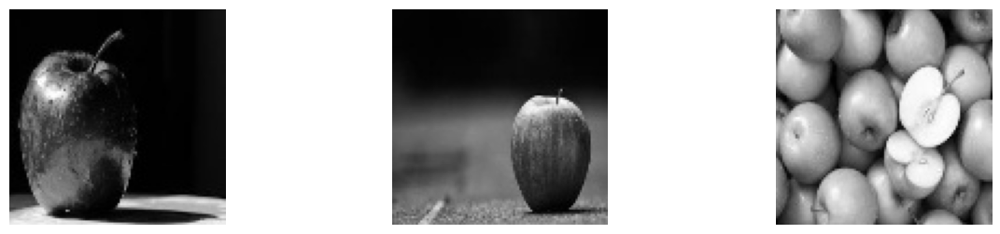

Primeras 3 imágenes de la clase 1:


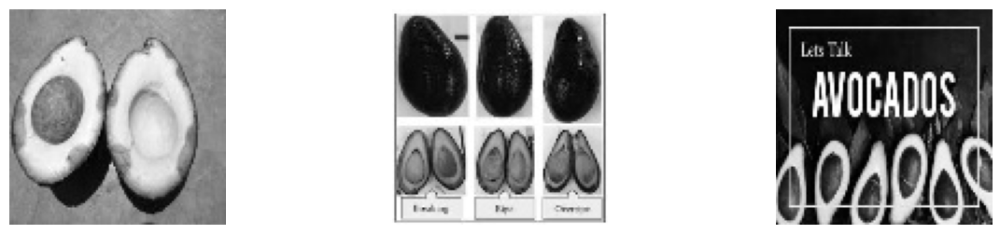

Primeras 3 imágenes de la clase 2:


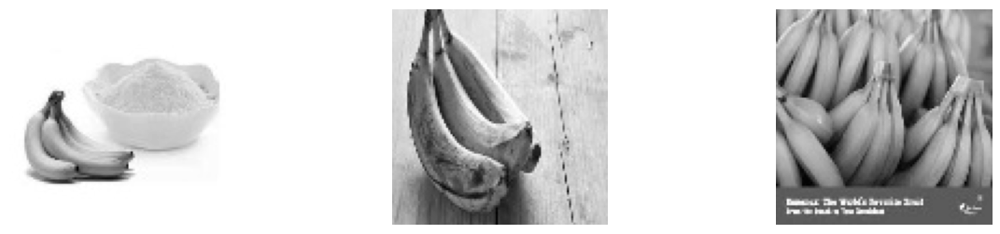

In [20]:
def visualizar_primeras_imagenes_por_etiqueta(X, y, etiqueta, n=3):
    indices = np.where(y == etiqueta)[0][:n]
    fig, axs = plt.subplots(1, n, figsize=(15, 3))
    for i, idx in enumerate(indices):
        axs[i].imshow(X[idx], cmap='gray')
        axs[i].axis('off')
    plt.show()

# Visualiza las primeras 5 imágenes de cada etiqueta
# Asumiendo que 0 es para una clase (ej., gatos) y 1 es para la otra (ej., perros)
print("Primeras 3 imágenes de la clase 0:")
visualizar_primeras_imagenes_por_etiqueta(X_ftg, y_ftg, 0)

print("Primeras 3 imágenes de la clase 1:")
visualizar_primeras_imagenes_por_etiqueta(X_ftg, y_ftg, 1)

print("Primeras 3 imágenes de la clase 2:")
visualizar_primeras_imagenes_por_etiqueta(X_ftg, y_ftg, 2)